# 🛰️ **Water Body Segmentation — DeepLabV3+ with Multispectral Data**

Pipeline:
1. Install & Imports
2. Load Raw Data
3. EDA (Exploratory Data Analysis)
4. Preprocessing
5. Dataset & DataLoader (with Augmentation)
6. Model — DeepLabV3+
7. Loss, Metrics & Optimizer
8. Training Loop
9. Evaluation

## **1. Install & Imports**

In [1]:
!pip install rasterio -qU
!pip install segmentation-models-pytorch -qU

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.0 MB/s eta 0:00:0000:01


In [2]:
import os
import random
import warnings
import numpy as np
import pandas as pd
import rasterio
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import torch
import torch.nn as nn
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader, Dataset
import torch.optim as optim
import segmentation_models_pytorch as smp

# ── Reproducibility ──
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', DEVICE)
print('PyTorch:', torch.__version__)
print('SMP    :', smp.__version__)

Device: cuda
PyTorch: 2.10.0+cu128
SMP    : 0.5.0


## **2. Load Raw Data**

In [3]:
# ── Kaggle paths ──
IMAGES_PATH = "/kaggle/input/datasets/mahmoudosamahassan/satellite-dataset/satalite data/data/images"
LABELS_PATH = "/kaggle/input/datasets/mahmoudosamahassan/satellite-dataset/satalite data/data/labels"

BAND_NAMES = [
    'Coastal Aerosol', 'Blue', 'Green', 'Red', 'NIR',
    'SWIR1', 'SWIR2', 'QA Band',
    'Merit DEM', 'Copernicus DEM',
    'ESA World Cover', 'Water Occurrence Prob'
]
N_BANDS = 12

In [4]:
# ── File discovery & pairing by stem name ──
all_image_files = sorted(os.listdir(IMAGES_PATH))
all_label_files = sorted(os.listdir(LABELS_PATH))

print(f"Raw image files : {len(all_image_files)}")
print(f"Raw label files : {len(all_label_files)}")

image_stems = {os.path.splitext(f)[0]: f for f in all_image_files}
label_stems = {os.path.splitext(f)[0]: f for f in all_label_files}

matched_stems   = sorted(set(image_stems) & set(label_stems))
unmatched_imgs  = set(image_stems) - set(label_stems)
unmatched_lbls  = set(label_stems) - set(image_stems)

print(f"\nMatched pairs        : {len(matched_stems)}")
print(f"Images without label : {len(unmatched_imgs)}")
print(f"Labels without image : {len(unmatched_lbls)}")

image_files = [image_stems[s] for s in matched_stems]
label_files = [label_stems[s] for s in matched_stems]

Raw image files : 306
Raw label files : 456

Matched pairs        : 306
Images without label : 0
Labels without image : 150


In [5]:
# ── Shape consistency check ──
expected_shape = (N_BANDS, 128, 128)
bad_files = []

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for f in image_files:
        with rasterio.open(os.path.join(IMAGES_PATH, f)) as src:
            shape = (src.count, src.height, src.width)
            if shape != expected_shape:
                bad_files.append((f, shape))

if bad_files:
    print(f'WARNING: {len(bad_files)} files have wrong shape:')
    for fname, shp in bad_files:
        print(f'  {fname}: {shp}')
else:
    print(f'All {len(image_files)} files have correct shape {expected_shape} ✓')

All 306 files have correct shape (12, 128, 128) ✓


In [6]:
# ── Load all data into memory ──
X_raw = np.zeros((len(image_files), 128, 128, N_BANDS), dtype=np.float32)
Y_raw = np.zeros((len(label_files), 128, 128, 1),       dtype=np.float32)

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for i, (img_f, lbl_f) in enumerate(zip(image_files, label_files)):
        with rasterio.open(os.path.join(IMAGES_PATH, img_f)) as src:
            img = src.read().astype(np.float32)          # (bands, H, W)
            X_raw[i] = np.transpose(img, (1, 2, 0))     # → (H, W, bands)

        lbl = np.array(Image.open(os.path.join(LABELS_PATH, lbl_f)))
        Y_raw[i, :, :, 0] = (lbl > 0).astype(np.float32)  # ensure binary

print(f'X_raw : {X_raw.shape}')
print(f'Y_raw : {Y_raw.shape}')
print(f'Label unique values: {np.unique(Y_raw)}')

X_raw : (306, 128, 128, 12)
Y_raw : (306, 128, 128, 1)
Label unique values: [0. 1.]


## **3. EDA — Exploratory Data Analysis**

### 3.1 Class Balance

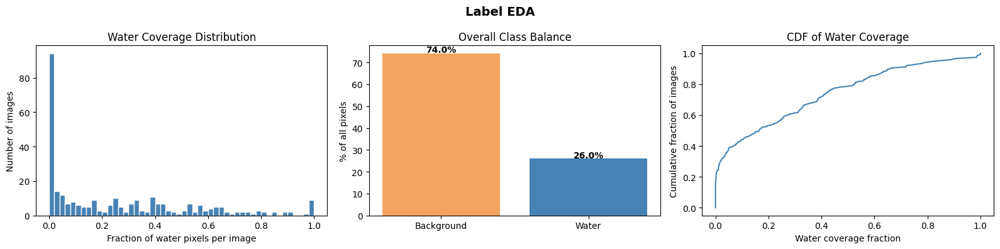

Images with NO water   : 45 (14.7%)
Images with <5%  water : 117 (38.2%)
Images with >50% water : 66 (21.6%)
Mean water coverage    : 25.98%
Imbalance ratio (bg:water): 2.8:1


In [7]:
water_ratios = Y_raw.squeeze().reshape(len(Y_raw), -1).mean(axis=1)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))

axes[0].hist(water_ratios, bins=50, color='steelblue', edgecolor='white')
axes[0].set_xlabel('Fraction of water pixels per image')
axes[0].set_ylabel('Number of images')
axes[0].set_title('Water Coverage Distribution')

overall_water = water_ratios.mean()
axes[1].bar(['Background', 'Water'],
            [(1-overall_water)*100, overall_water*100],
            color=['sandybrown', 'steelblue'])
axes[1].set_ylabel('% of all pixels')
axes[1].set_title('Overall Class Balance')
for bar, val in zip(axes[1].patches, [(1-overall_water)*100, overall_water*100]):
    axes[1].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
                 f'{val:.1f}%', ha='center', fontweight='bold')

sorted_r = np.sort(water_ratios)
axes[2].plot(sorted_r, np.linspace(0, 1, len(sorted_r)), color='steelblue')
axes[2].set_xlabel('Water coverage fraction')
axes[2].set_ylabel('Cumulative fraction of images')
axes[2].set_title('CDF of Water Coverage')

plt.suptitle('Label EDA', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f'Images with NO water   : {(water_ratios==0).sum()} ({(water_ratios==0).mean():.1%})')
print(f'Images with <5%  water : {(water_ratios<0.05).sum()} ({(water_ratios<0.05).mean():.1%})')
print(f'Images with >50% water : {(water_ratios>0.5).sum()} ({(water_ratios>0.5).mean():.1%})')
print(f'Mean water coverage    : {overall_water:.2%}')
print(f'Imbalance ratio (bg:water): {(1-overall_water)/overall_water:.1f}:1')

### 3.2 Per-Band Raw Statistics

In [8]:
stats = []
for b in range(N_BANDS):
    bd = X_raw[..., b]
    stats.append({
        'Band'              : BAND_NAMES[b],
        'Min'               : bd.min(),
        'Max'               : bd.max(),
        'Mean'              : bd.mean(),
        'Std'               : bd.std(),
        'Median'            : np.median(bd),
        '1st Pct'           : np.percentile(bd, 1),
        '99th Pct'          : np.percentile(bd, 99),
        'NoData % (<-9000)' : (bd < -9000).mean() * 100
    })

pd.DataFrame(stats).set_index('Band').round(2)

,Min,Max,Mean,Std,Median,1st Pct,99th Pct,NoData % (<-9000)
Band,,,,,,,,
Coastal Aerosol,-1393.0,6568.0,396.470001,270.070007,363.0,36.0,1123.0,0.00
Blue,-1169.0,9659.0,494.619995,325.980011,458.0,70.0,1357.0,0.00
Green,-722.0,11368.0,822.320007,418.119995,775.0,181.0,2000.0,0.00
Red,-684.0,12041.0,973.679993,586.700012,904.0,27.0,2680.0,0.00
NIR,-412.0,15841.0,2090.110107,1055.979980,2164.0,-28.0,4347.0,0.00
SWIR1,-335.0,15252.0,1964.050049,1191.420044,1987.0,-3.0,4624.0,0.00
SWIR2,-258.0,14647.0,1351.270020,961.760010,1251.0,3.0,3947.0,0.00
QA Band,64.0,255.0,102.739998,48.799999,64.0,64.0,224.0,0.00
Merit DEM,-9999.0,4245.0,141.800003,1364.979980,119.0,-9999.0,2431.0,1.55


### 3.3 Per-Band Histograms

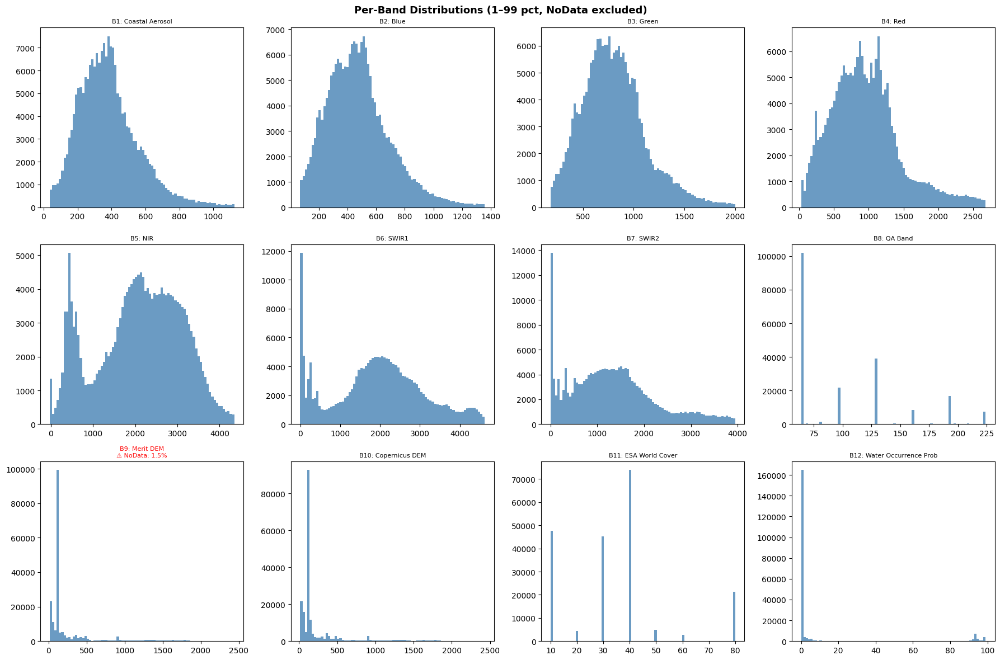

In [9]:
fig, axes = plt.subplots(3, 4, figsize=(18, 12))
axes = axes.flatten()

for b in range(N_BANDS):
    band_data = X_raw[..., b].flatten()
    valid     = band_data[band_data > -9000]
    p1, p99   = np.percentile(valid, [1, 99])
    clipped   = valid[(valid >= p1) & (valid <= p99)]
    sample    = np.random.choice(clipped, size=min(200_000, len(clipped)), replace=False)

    axes[b].hist(sample, bins=80, color='steelblue', alpha=0.8, edgecolor='none')
    nodata_pct = (X_raw[..., b] < -9000).mean() * 100
    title = f'B{b+1}: {BAND_NAMES[b]}'
    if nodata_pct > 0:
        title += f'\n⚠ NoData: {nodata_pct:.1f}%'
        axes[b].set_title(title, fontsize=8, color='red')
    else:
        axes[b].set_title(title, fontsize=8)

plt.suptitle('Per-Band Distributions (1–99 pct, NoData excluded)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### 3.4 Water vs Land Separation Per Band

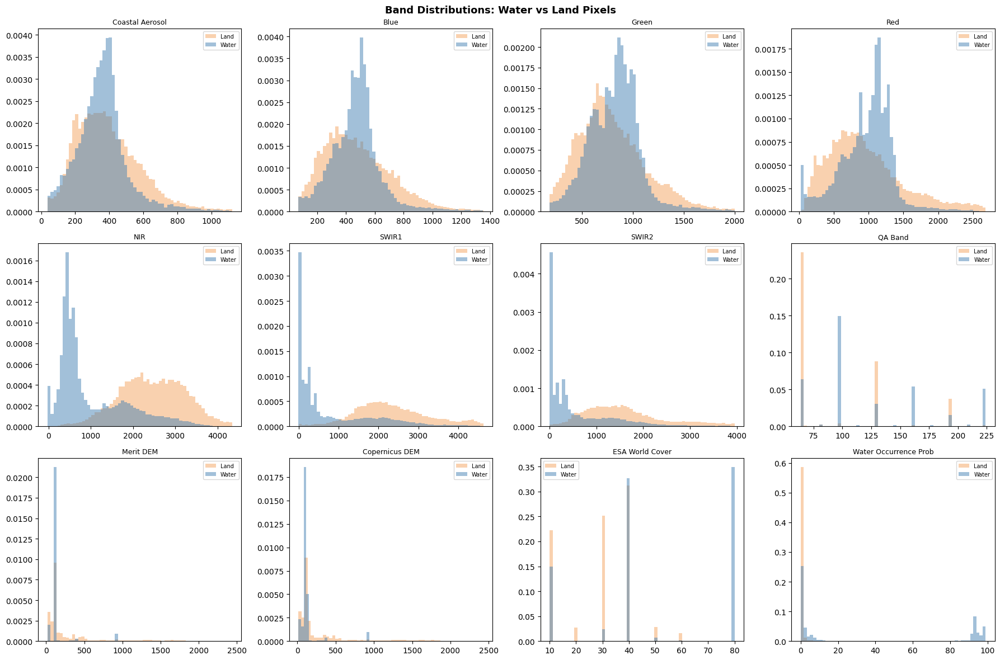

In [10]:
water_mask = Y_raw.squeeze().astype(bool)

fig, axes = plt.subplots(3, 4, figsize=(18, 12))
axes = axes.flatten()

for b in range(N_BANDS):
    bd = X_raw[..., b]
    w  = bd[water_mask].flatten();  w = w[w > -9000]
    l  = bd[~water_mask].flatten(); l = l[l > -9000]
    all_v = np.concatenate([w, l])
    p1, p99 = np.percentile(all_v, [1, 99])
    w = w[(w>=p1)&(w<=p99)]; l = l[(l>=p1)&(l<=p99)]
    ws = np.random.choice(w, min(30000,len(w)), replace=False)
    ls = np.random.choice(l, min(30000,len(l)), replace=False)
    axes[b].hist(ls, bins=60, alpha=0.5, label='Land',  color='sandybrown', density=True)
    axes[b].hist(ws, bins=60, alpha=0.5, label='Water', color='steelblue',  density=True)
    axes[b].set_title(BAND_NAMES[b], fontsize=9)
    axes[b].legend(fontsize=7)

plt.suptitle('Band Distributions: Water vs Land Pixels', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### 3.5 Inter-Band Correlation

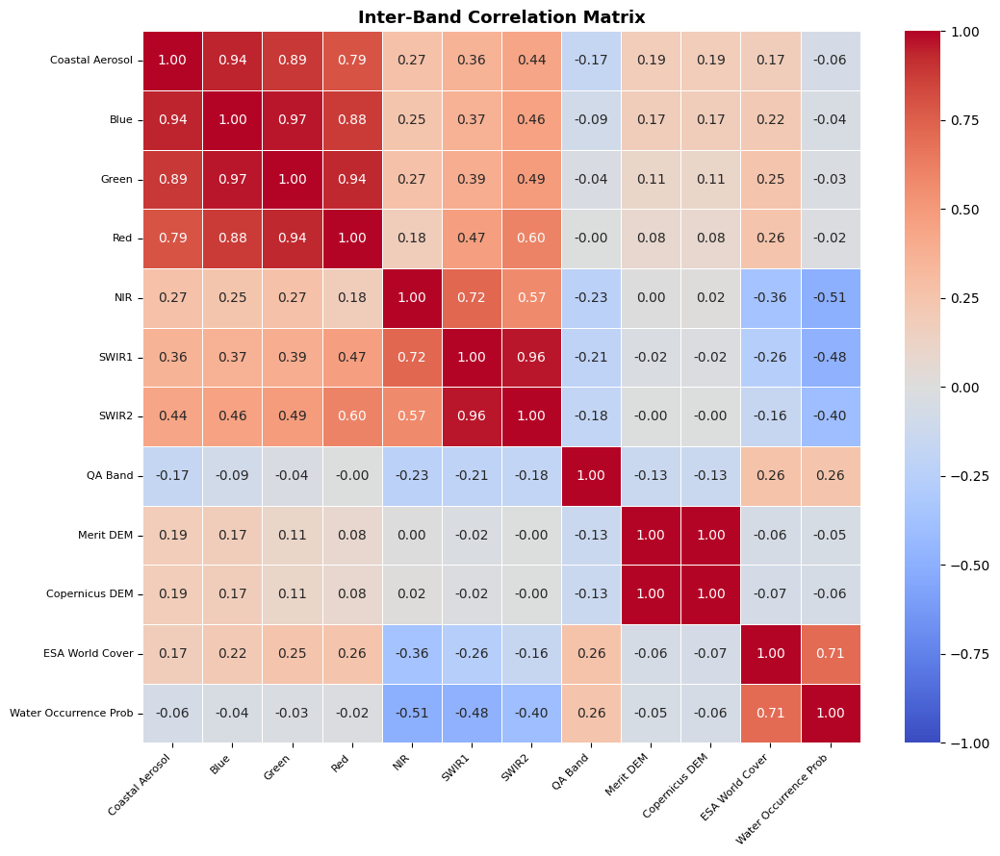

In [11]:
flat_X = X_raw.reshape(-1, N_BANDS)
valid  = flat_X[(flat_X > -9000).all(axis=1)]
idx    = np.random.choice(len(valid), min(300_000, len(valid)), replace=False)
corr   = np.corrcoef(valid[idx].T)

plt.figure(figsize=(11, 9))
sns.heatmap(corr, xticklabels=BAND_NAMES, yticklabels=BAND_NAMES,
            annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Inter-Band Correlation Matrix', fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.show()

### 3.6 NDWI & MNDWI Separation Power
> NDWI "Normalized Difference Water Index" = (Green - NIR) / (Green + NIR + Epsilon) #Epsilon = 1e-8 => to avoid devide by zero
>> MNDWI "Modified NDWI" = (Green - SWIR) / (Green + SWIR + Epsilon) #Epsilon = 1e-8 => to avoid devide by zero)

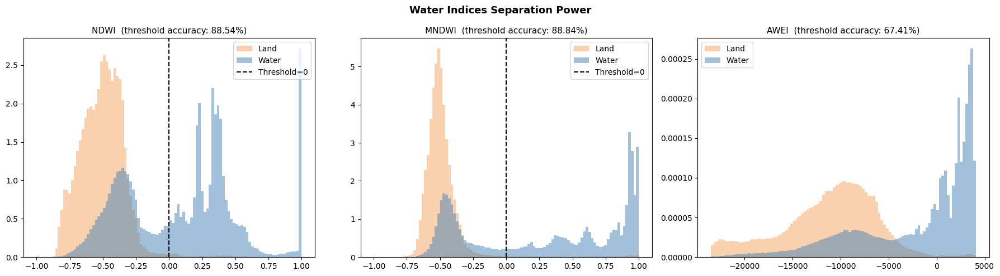

In [12]:
green = np.clip(X_raw[..., 2].astype(np.float32), 0, None)
nir   = np.clip(X_raw[..., 4].astype(np.float32), 0, None)
swir1 = np.clip(X_raw[..., 5].astype(np.float32), 0, None)
swir2 = np.clip(X_raw[..., 6].astype(np.float32), 0, None)

ndwi  = np.clip((green - nir)   / (green + nir   + 1e-8), -1, 1)
mndwi = np.clip((green - swir1) / (green + swir1 + 1e-8), -1, 1)
awei  = 4*(green - swir1) - (0.25*nir + 2.75*swir2)  # raw, not clipped

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, idx_map, name, clip in zip(
        axes,
        [ndwi, mndwi, awei],
        ['NDWI', 'MNDWI', 'AWEI'],
        [(-1,1), (-1,1), None]):

    w_v = idx_map[water_mask].flatten()
    l_v = idx_map[~water_mask].flatten()
    if clip:
        w_v = np.clip(w_v, *clip); l_v = np.clip(l_v, *clip)
    else:
        p1,p99 = np.percentile(np.concatenate([w_v,l_v]),[1,99])
        w_v = w_v[(w_v>=p1)&(w_v<=p99)]; l_v = l_v[(l_v>=p1)&(l_v<=p99)]

    ax.hist(l_v, bins=100, alpha=0.5, label='Land',  color='sandybrown', density=True)
    ax.hist(w_v, bins=100, alpha=0.5, label='Water', color='steelblue',  density=True)
    if name != 'AWEI':
        ax.axvline(0, color='black', linestyle='--', linewidth=1.5, label='Threshold=0')
    thresh = 0 if name != 'AWEI' else np.median(np.concatenate([w_v,l_v]))
    all_v  = np.concatenate([w_v, l_v])
    all_lb = np.concatenate([np.ones(len(w_v)), np.zeros(len(l_v))])
    acc    = ((all_v > thresh) == all_lb).mean()
    ax.set_title(f'{name}  (threshold accuracy: {acc:.2%})', fontsize=11)
    ax.legend()

plt.suptitle('Water Indices Separation Power', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

### 3.7 Visual Sample Inspection

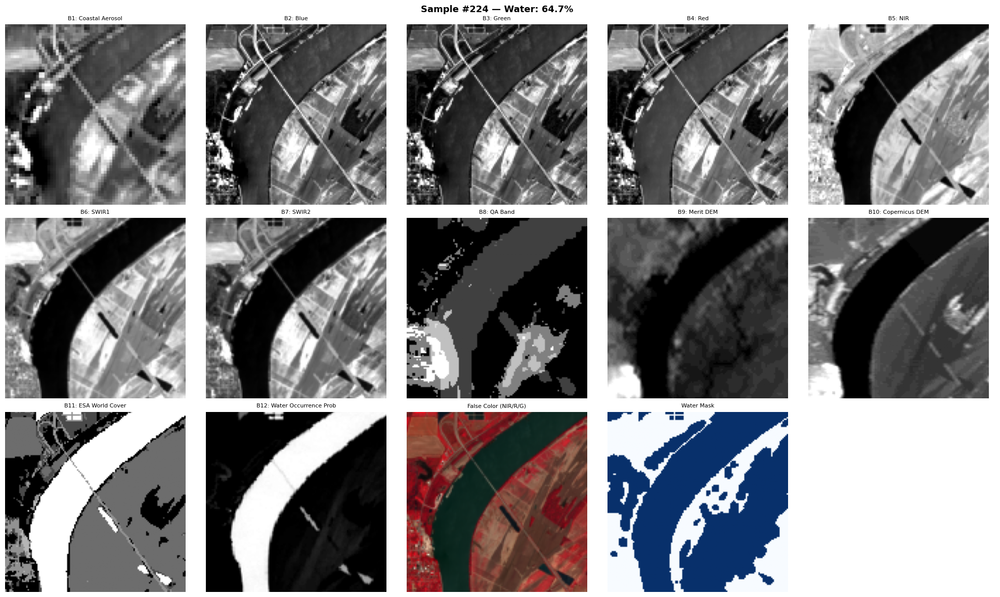

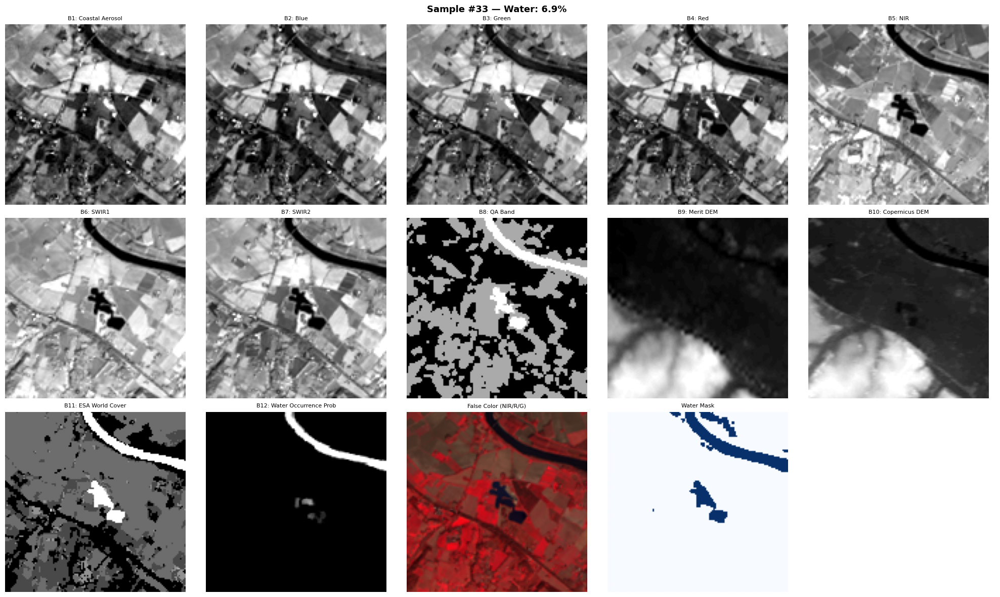

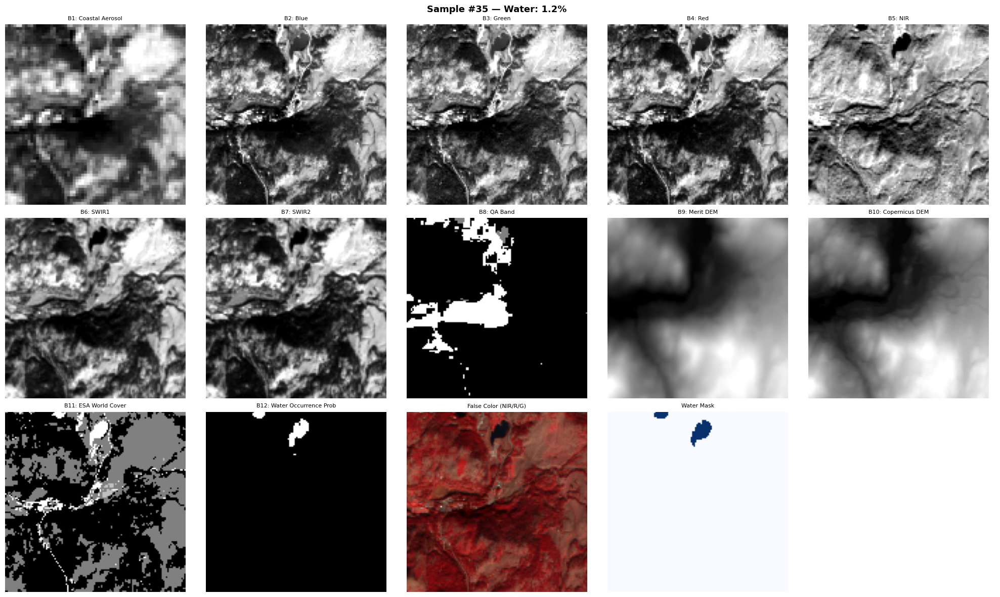

In [13]:
def visualize_sample(X, Y, idx):
    fig, axes = plt.subplots(3, 5, figsize=(20, 12))
    axes = axes.flatten()
    for b in range(N_BANDS):
        band = X[idx, :, :, b].copy()
        band[band < -9000] = np.nan
        p1, p99 = np.nanpercentile(band, 2), np.nanpercentile(band, 98)
        disp = np.clip((band - p1) / (p99 - p1 + 1e-8), 0, 1)
        axes[b].imshow(disp, cmap='gray')
        axes[b].set_title(f'B{b+1}: {BAND_NAMES[b]}', fontsize=8)
        axes[b].axis('off')
    # False color NIR/Red/Green
    rgb = np.stack([np.clip(X[idx,:,:,c],0,10000) for c in [4,3,2]], axis=-1).astype(float)
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)
    axes[12].imshow(rgb); axes[12].set_title('False Color (NIR/R/G)', fontsize=8); axes[12].axis('off')
    axes[13].imshow(Y[idx].squeeze(), cmap='Blues', vmin=0, vmax=1)
    axes[13].set_title('Water Mask', fontsize=8); axes[13].axis('off')
    axes[14].axis('off')
    plt.suptitle(f'Sample #{idx} — Water: {Y[idx].mean():.1%}', fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()

for i in np.random.choice(len(X_raw), 3, replace=False):
    visualize_sample(X_raw, Y_raw, i)

### 3.8 QA Band Analysis

In [14]:
qa = X_raw[..., 7].astype(int)
cloud        = ((qa >> 3) & 1)
cloud_shadow = ((qa >> 4) & 1)
adj_cloud    = ((qa >> 5) & 1)
any_bad      = ((cloud | cloud_shadow | adj_cloud) > 0)

print('QA Band Analysis:')
print(f'  Cloud pixels         : {cloud.mean():.2%}')
print(f'  Cloud shadow pixels  : {cloud_shadow.mean():.2%}')
print(f'  Adjacent cloud pixels: {adj_cloud.mean():.2%}')
print(f'  Any bad pixel        : {any_bad.mean():.2%}')
print(f'  Clean pixels         : {(~any_bad).mean():.2%}')

QA Band Analysis:
  Cloud pixels         : 0.11%
  Cloud shadow pixels  : 1.62%
  Adjacent cloud pixels: 19.43%
  Any bad pixel        : 20.65%
  Clean pixels         : 79.35%


## **4. Preprocessing**

Each band group handled by its physical meaning. Stats fitted on train only.

In [15]:
def preprocess(X_raw, fit_stats=None):
    """
    Full preprocessing pipeline for the 12-band satellite data.

    Band groups:
      0–6  : Spectral reflectance → clip [0,10000] then per-band standardize
      7    : QA bitmask           → decode to binary bad-pixel flag
      8–9  : DEM                  → fix NoData (-9999), then min-max [0,1]
      10   : ESA World Cover      → binary water flag (class 80)
      11   : Water occurrence     → divide by 100

    Engineered channels appended:
      12   : NDWI  = (Green - NIR)   / (Green + NIR   + ε)
      13   : MNDWI = (Green - SWIR1) / (Green + SWIR1 + ε)
      14   : AWEI  = 4*(Green-SWIR1) - (0.25*NIR + 2.75*SWIR2)  [normalized]

    Returns (N, H, W, 15), fit_stats
    """
    X = X_raw.copy().astype(np.float32)

    # ── 1. Spectral reflectance (0–6) ─────────────────────────────────────────
    REFL_BANDS = list(range(7))
    for b in REFL_BANDS:
        X[..., b] = np.clip(X[..., b], 0.0, 10000.0)

    if fit_stats is None:
        refl_mean = np.array([X[..., b].mean() for b in REFL_BANDS], dtype=np.float32)
        refl_std  = np.array([X[..., b].std() + 1e-8 for b in REFL_BANDS], dtype=np.float32)
    else:
        refl_mean, refl_std = fit_stats['refl_mean'], fit_stats['refl_std']

    for i, b in enumerate(REFL_BANDS):
        X[..., b] = (X[..., b] - refl_mean[i]) / refl_std[i]

    # ── 2. QA band (7) → binary bad-pixel flag ────────────────────────────────
    qa_int = X_raw[..., 7].astype(np.int32)
    bad    = np.clip(((qa_int>>3)&1) + ((qa_int>>4)&1) + ((qa_int>>5)&1), 0, 1)
    X[..., 7] = bad.astype(np.float32)

    # ── 3. DEM (8–9) → NoData fill + min-max ─────────────────────────────────
    if fit_stats is None:
        dem_fill, dem_min, dem_max = {}, {}, {}

    for b in [8, 9]:
        nd = X[..., b] < -9000
        if fit_stats is None:
            valid      = X[..., b][~nd]
            fill_val   = float(np.median(valid)) if valid.size > 0 else 0.0
            bmin, bmax = float(valid.min()), float(valid.max())
            dem_fill[b], dem_min[b], dem_max[b] = fill_val, bmin, bmax
        else:
            fill_val = fit_stats['dem_fill'][b]
            bmin, bmax = fit_stats['dem_min'][b], fit_stats['dem_max'][b]
        X[..., b][nd] = fill_val
        X[..., b] = np.clip((X[..., b] - bmin) / (bmax - bmin + 1e-8), 0, 1)

    # ── 4. ESA World Cover (10) → binary water flag ───────────────────────────
    X[..., 10] = (X_raw[..., 10].astype(int) == 80).astype(np.float32)

    # ── 5. Water occurrence probability (11) → [0,1] ─────────────────────────
    X[..., 11] = np.clip(X_raw[..., 11] / 100.0, 0, 1)

    # ── 6. Engineered water indices ───────────────────────────────────────────
    g = np.clip(X_raw[..., 2], 0, 10000).astype(np.float32)
    n = np.clip(X_raw[..., 4], 0, 10000).astype(np.float32)
    s1= np.clip(X_raw[..., 5], 0, 10000).astype(np.float32)
    s2= np.clip(X_raw[..., 6], 0, 10000).astype(np.float32)

    ndwi  = np.clip((g - n)  / (g + n  + 1e-8), -1, 1)
    mndwi = np.clip((g - s1) / (g + s1 + 1e-8), -1, 1)
    awei  = 4*(g - s1) - (0.25*n + 2.75*s2)     # raw

    if fit_stats is None:
        awei_mean = float(awei.mean())
        awei_std  = float(awei.std() + 1e-8)
    else:
        awei_mean, awei_std = fit_stats['awei_mean'], fit_stats['awei_std']

    awei_norm = (awei - awei_mean) / awei_std

    X = np.concatenate([
        X,
        ndwi[..., np.newaxis],
        mndwi[..., np.newaxis],
        awei_norm[..., np.newaxis]
    ], axis=-1)   # → (N, H, W, 15)

    if fit_stats is None:
        fit_stats = {
            'refl_mean': refl_mean, 'refl_std': refl_std,
            'dem_fill': dem_fill, 'dem_min': dem_min, 'dem_max': dem_max,
            'awei_mean': awei_mean, 'awei_std': awei_std
        }

    return X, fit_stats

In [16]:
# ── Split BEFORE preprocessing — fit stats on train only ──────────────────────
X_tr_raw, X_tmp_raw, Y_train, Y_tmp = train_test_split(
    X_raw, Y_raw, test_size=0.2, random_state=SEED)
X_val_raw, X_te_raw, Y_val, Y_test = train_test_split(
    X_tmp_raw, Y_tmp, test_size=0.5, random_state=SEED)

print(f'Train: {X_tr_raw.shape[0]}  Val: {X_val_raw.shape[0]}  Test: {X_te_raw.shape[0]}')

Train: 244  Val: 31  Test: 31


In [17]:
X_train, fit_stats = preprocess(X_tr_raw,  fit_stats=None)
X_val,   _         = preprocess(X_val_raw, fit_stats=fit_stats)
X_test,  _         = preprocess(X_te_raw,  fit_stats=fit_stats)

N_CHANNELS = X_train.shape[-1]   # 15
PROC_NAMES = BAND_NAMES + ['NDWI', 'MNDWI', 'AWEI']

print(f'X_train: {X_train.shape}  |  channels: {N_CHANNELS}')

# Verify no NaNs
for name, arr in [('X_train', X_train), ('X_val', X_val), ('X_test', X_test)]:
    print(f'{name} — NaN: {np.isnan(arr).any()}, min: {arr.min():.3f}, max: {arr.max():.3f}')

X_train: (244, 128, 128, 15)  |  channels: 15
X_train — NaN: False, min: -6.468, max: 28.259
X_val — NaN: False, min: -5.138, max: 21.621
X_test — NaN: False, min: -3.188, max: 14.133


In [18]:
import pickle

# Save fit_stats separately as a standalone file
with open('/kaggle/working/fit_stats_deeplab.pkl', 'wb') as f:
    pickle.dump(fit_stats, f)

print("fit_stats saved ✓")
print("Keys:", list(fit_stats.keys()))

fit_stats saved ✓
Keys: ['refl_mean', 'refl_std', 'dem_fill', 'dem_min', 'dem_max', 'awei_mean', 'awei_std']


In [19]:
# ── Per-channel stats after preprocessing ──
proc_stats = []
for b in range(N_CHANNELS):
    proc_stats.append({
        'Channel': PROC_NAMES[b],
        'Min'    : round(X_train[..., b].min(), 4),
        'Max'    : round(X_train[..., b].max(), 4),
        'Mean'   : round(X_train[..., b].mean(), 4),
        'Std'    : round(X_train[..., b].std(), 4),
    })
pd.DataFrame(proc_stats).set_index('Channel')

,Min,Max,Mean,Std
Channel,,,,
Coastal Aerosol,-1.5154,23.173500,0.0000,1.0000
Blue,-1.5506,28.258801,0.0000,1.0000
Green,-1.9923,21.857300,0.0000,1.0000
Red,-1.6692,15.237800,0.0000,1.0000
NIR,-1.9593,7.347400,-0.0000,1.0000
SWIR1,-1.6289,6.617700,-0.0000,1.0000
SWIR2,-1.3917,8.835000,0.0000,1.0000
QA Band,0.0000,1.000000,0.2147,0.4106
Merit DEM,0.0000,1.000000,0.0645,0.1106


In [20]:
# ── Class imbalance weight for loss ──
total_px  = Y_train.size
water_px  = Y_train.sum()
bg_px     = total_px - water_px
POS_WEIGHT = float(bg_px / (water_px + 1e-8))

print(f'Water ratio  : {water_px/total_px:.2%}')
print(f'Imbalance    : {bg_px/water_px:.1f}:1')
print(f'pos_weight   : {POS_WEIGHT:.2f}')

Water ratio  : 26.87%
Imbalance    : 2.7:1
pos_weight   : 2.72


## **5. Dataset & DataLoader (with Augmentation)**

In [21]:
class WaterDataset(Dataset):
    """
    PyTorch Dataset for water segmentation.
    Expects numpy arrays (N, H, W, C) for images and (N, H, W, 1) for masks.
    Augmentation applied consistently to both image and mask.
    """
    def __init__(self, images, masks, augment=False):
        # Convert to torch: (N, C, H, W)
        self.images  = torch.tensor(images).permute(0, 3, 1, 2).float()
        self.masks   = torch.tensor(masks).permute(0, 3, 1, 2).float()
        self.augment = augment

    def __len__(self):
        return len(self.images)

    def _augment(self, image, mask):
        """Apply identical random spatial transforms to image and mask."""
        # Random horizontal flip
        if random.random() > 0.5:
            image = TF.hflip(image)
            mask  = TF.hflip(mask)
        # Random vertical flip
        if random.random() > 0.5:
            image = TF.vflip(image)
            mask  = TF.vflip(mask)
        # Random 90° rotation
        k = random.choice([0, 1, 2, 3])
        if k > 0:
            image = torch.rot90(image, k, dims=[1, 2])
            mask  = torch.rot90(mask,  k, dims=[1, 2])
        return image, mask

    def __getitem__(self, idx):
        image = self.images[idx]
        mask  = self.masks[idx]
        if self.augment:
            image, mask = self._augment(image, mask)
        return image, mask


BATCH_SIZE = 8

train_dataset = WaterDataset(X_train, Y_train, augment=True)
val_dataset   = WaterDataset(X_val,   Y_val,   augment=False)
test_dataset  = WaterDataset(X_test,  Y_test,  augment=False)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

print(f'Train batches: {len(train_loader)}')
print(f'Val   batches: {len(val_loader)}')
print(f'Test  batches: {len(test_loader)}')

Train batches: 31
Val   batches: 4
Test  batches: 4


## **6. Model — DeepLabV3+**

In [22]:
# ── DeepLabV3+ with EfficientNet-b3 backbone ──
# Using DeepLabV3Plus (not DeepLabV3) — the '+' adds a sharper decoder
# that recovers fine boundary details, important for water body edges.
model = smp.DeepLabV3Plus(
    encoder_name    = 'efficientnet-b3',
    encoder_weights = 'imagenet',
    in_channels     = N_CHANNELS,   # 15
    classes         = 1,
    activation      = None          # raw logits — we apply sigmoid in loss/metrics
)

model = model.to(DEVICE)

# Parameter count
total_params    = sum(p.numel() for p in model.parameters())
trainable_params= sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Total params    : {total_params:,}')
print(f'Trainable params: {trainable_params:,}')

config.json:   0%|          | 0.00/106 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

Total params    : 11,684,505
Trainable params: 11,684,505


## **7. Loss, Metrics & Optimizer**

In [23]:
# ── Loss ──
class CombinedLoss(nn.Module):
    """
    Weighted BCE + Dice Loss.
    - Weighted BCE handles class imbalance pixel-by-pixel.
    - Dice Loss directly optimizes the overlap metric.
    """
    def __init__(self, pos_weight=POS_WEIGHT, smooth=1e-6):
        super().__init__()
        self.bce   = nn.BCEWithLogitsLoss(
            pos_weight=torch.tensor([pos_weight], device=DEVICE)
        )
        self.smooth = smooth

    def dice_loss(self, logits, targets):
        probs = torch.sigmoid(logits)
        pf    = probs.view(-1)
        tf    = targets.view(-1)
        inter = (pf * tf).sum()
        return 1 - (2*inter + self.smooth) / (pf.sum() + tf.sum() + self.smooth)

    def forward(self, logits, targets):
        return self.bce(logits, targets) + self.dice_loss(logits, targets)


criterion = CombinedLoss(pos_weight=POS_WEIGHT)


# ── Metrics ──
def compute_metrics(logits, masks, threshold=0.5):
    """Returns dict of IoU, Precision, Recall, F1."""
    preds = (torch.sigmoid(logits) > threshold)
    masks = masks.bool()

    tp = (preds & masks).float().sum()
    fp = (preds & (~masks)).float().sum()
    fn = ((~preds) & masks).float().sum()
    tn = ((~preds) & (~masks)).float().sum()

    precision = tp / (tp + fp + 1e-7)
    recall    = tp / (tp + fn + 1e-7)
    f1        = 2 * precision * recall / (precision + recall + 1e-7)
    iou       = tp / (tp + fp + fn + 1e-7)

    return {
        'iou'      : iou.item(),
        'precision': precision.item(),
        'recall'   : recall.item(),
        'f1'       : f1.item()
    }


# ── Optimizer & Scheduler ──
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5,
    patience=7, min_lr=1e-7
)

print('Loss     : Weighted BCE + Dice')
print('Optimizer: AdamW  lr=1e-4  wd=1e-4')
print('Scheduler: ReduceLROnPlateau (patience=7)')

Loss     : Weighted BCE + Dice
Optimizer: AdamW  lr=1e-4  wd=1e-4
Scheduler: ReduceLROnPlateau (patience=7)


## **8. Training Loop**

In [24]:
import torch
print("PyTorch version :", torch.__version__)
print("CUDA version    :", torch.version.cuda)
print("GPU             :", torch.cuda.get_device_name(0))
print("GPU capability  :", torch.cuda.get_device_capability(0))

PyTorch version : 2.10.0+cu128
CUDA version    : 12.8
GPU             : Tesla T4
GPU capability  : (7, 5)


In [25]:
EPOCHS        = 100
PATIENCE      = 20       # early stopping patience
BEST_MODEL_PATH = '/kaggle/working/best_deeplab.pth'

history = {
    'train_loss': [], 'val_loss': [],
    'train_iou':  [], 'val_iou':  [],
    'train_f1':   [], 'val_f1':   [],
    'train_prec': [], 'val_prec': [],
    'train_rec':  [], 'val_rec':  [],
    'lr':         []
}

best_val_iou = 0.0
patience_counter = 0


def run_epoch(loader, train=True):
    if train:
        model.train()
    else:
        model.eval()

    total_loss = 0
    total_metrics = {'iou': 0, 'precision': 0, 'recall': 0, 'f1': 0}

    ctx = torch.enable_grad() if train else torch.no_grad()
    with ctx:
        for images, masks in loader:
            images = images.to(DEVICE)
            masks  = masks.to(DEVICE)

            if train:
                optimizer.zero_grad()

            outputs = model(images)
            loss    = criterion(outputs, masks)

            if train:
                loss.backward()
                # Gradient clipping to prevent explosions
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()

            total_loss += loss.item()
            m = compute_metrics(outputs, masks)
            for k in total_metrics:
                total_metrics[k] += m[k]

    n = len(loader)
    return total_loss / n, {k: v / n for k, v in total_metrics.items()}


print(f'Training for up to {EPOCHS} epochs (early stopping patience={PATIENCE})...')

for epoch in range(1, EPOCHS + 1):
    train_loss, train_m = run_epoch(train_loader, train=True)
    val_loss,   val_m   = run_epoch(val_loader,   train=False)

    # Scheduler step on val IoU
    scheduler.step(val_m['iou'])
    current_lr = optimizer.param_groups[0]['lr']

    # Log history
    history['train_loss'].append(train_loss);  history['val_loss'].append(val_loss)
    history['train_iou'].append(train_m['iou']); history['val_iou'].append(val_m['iou'])
    history['train_f1'].append(train_m['f1']);   history['val_f1'].append(val_m['f1'])
    history['train_prec'].append(train_m['precision']); history['val_prec'].append(val_m['precision'])
    history['train_rec'].append(train_m['recall']);      history['val_rec'].append(val_m['recall'])
    history['lr'].append(current_lr)

    # Save best model
    if val_m['iou'] > best_val_iou:
        best_val_iou = val_m['iou']
        patience_counter = 0
        torch.save({
            'epoch'            : epoch,
            'model_state_dict' : model.state_dict(),
            'optimizer_state'  : optimizer.state_dict(),
            'val_iou'          : best_val_iou,
            'fit_stats'        : fit_stats
        }, BEST_MODEL_PATH)
        marker = '  ← best'
    else:
        patience_counter += 1
        marker = ''

    print(f'Epoch {epoch:3d}/{EPOCHS} | '
          f'Loss {train_loss:.4f}/{val_loss:.4f} | '
          f'IoU {train_m["iou"]:.4f}/{val_m["iou"]:.4f} | '
          f'F1 {train_m["f1"]:.4f}/{val_m["f1"]:.4f} | '
          f'LR {current_lr:.2e}{marker}')

    # Early stopping
    if patience_counter >= PATIENCE:
        print(f'\nEarly stopping at epoch {epoch} — best val IoU: {best_val_iou:.4f}')
        break

print(f'\nTraining complete. Best Val IoU: {best_val_iou:.4f}')

Training for up to 100 epochs (early stopping patience=20)...
Epoch   1/100 | Loss 1.4434/1.4446 | IoU 0.3891/0.4625 | F1 0.5469/0.6306 | LR 1.00e-04  ← best
Epoch   2/100 | Loss 1.1616/1.0127 | IoU 0.4801/0.5868 | F1 0.6288/0.7354 | LR 1.00e-04  ← best
Epoch   3/100 | Loss 0.9965/0.8750 | IoU 0.5401/0.6046 | F1 0.6893/0.7497 | LR 1.00e-04  ← best
Epoch   4/100 | Loss 0.9313/0.7630 | IoU 0.5665/0.6315 | F1 0.7087/0.7672 | LR 1.00e-04  ← best
Epoch   5/100 | Loss 0.9367/0.7189 | IoU 0.5506/0.6509 | F1 0.6925/0.7827 | LR 1.00e-04  ← best
Epoch   6/100 | Loss 0.8505/0.6999 | IoU 0.5952/0.6420 | F1 0.7317/0.7766 | LR 1.00e-04
Epoch   7/100 | Loss 0.8132/0.6511 | IoU 0.6037/0.6803 | F1 0.7374/0.8047 | LR 1.00e-04  ← best
Epoch   8/100 | Loss 0.8491/0.6512 | IoU 0.5995/0.6810 | F1 0.7363/0.8055 | LR 1.00e-04  ← best
Epoch   9/100 | Loss 0.7511/0.6033 | IoU 0.6360/0.6989 | F1 0.7645/0.8177 | LR 1.00e-04  ← best
Epoch  10/100 | Loss 0.7288/0.5854 | IoU 0.6362/0.6972 | F1 0.7631/0.8178 | LR 1.0

In [26]:
import json
with open('/kaggle/working/deeplab_history.json', 'w') as f:
    json.dump({k: [float(v) for v in vals] 
               for k, vals in history.items()}, f)
print("Training history saved ✓")

Training history saved ✓


### 8.1 Training Curves

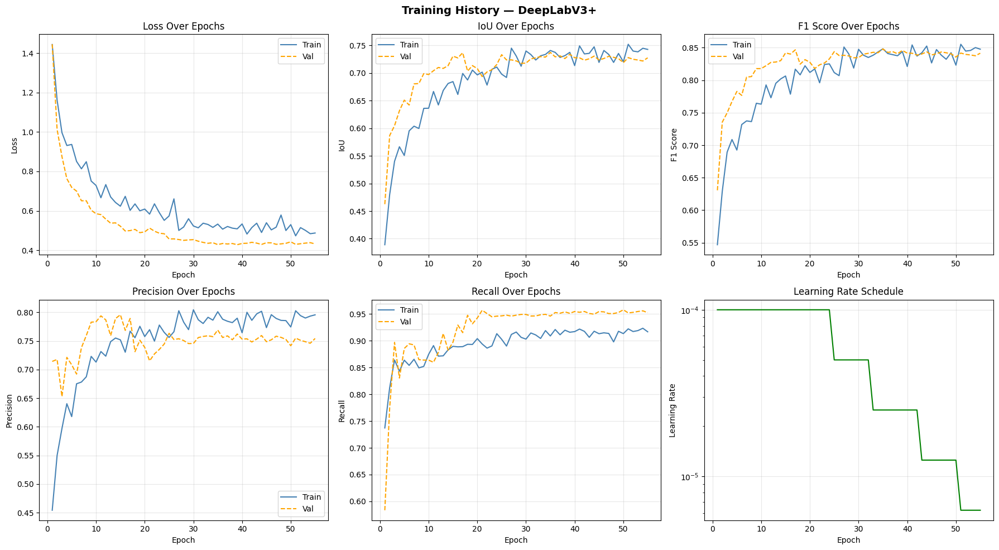

In [27]:
def plot_history(history):
    epochs = range(1, len(history['train_loss']) + 1)
    pairs  = [
        ('train_loss', 'val_loss',  'Loss'),
        ('train_iou',  'val_iou',   'IoU'),
        ('train_f1',   'val_f1',    'F1 Score'),
        ('train_prec', 'val_prec',  'Precision'),
        ('train_rec',  'val_rec',   'Recall'),
    ]

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for i, (train_key, val_key, label) in enumerate(pairs):
        axes[i].plot(epochs, history[train_key], label=f'Train', color='steelblue')
        axes[i].plot(epochs, history[val_key],   label=f'Val',   color='orange', linestyle='--')
        axes[i].set_xlabel('Epoch'); axes[i].set_ylabel(label)
        axes[i].set_title(f'{label} Over Epochs')
        axes[i].legend(); axes[i].grid(True, alpha=0.3)

    axes[5].plot(epochs, history['lr'], color='green')
    axes[5].set_xlabel('Epoch'); axes[5].set_ylabel('Learning Rate')
    axes[5].set_title('Learning Rate Schedule')
    axes[5].set_yscale('log'); axes[5].grid(True, alpha=0.3)

    plt.suptitle('Training History — DeepLabV3+', fontsize=14, fontweight='bold')
    plt.tight_layout(); plt.show()

plot_history(history)

---
## 9. Evaluation

### 9.1 Load Best Model & Test Set Metrics

In [28]:
# checkpoint = torch.load(BEST_MODEL_PATH, map_location=DEVICE)
checkpoint = torch.load(BEST_MODEL_PATH, map_location=DEVICE, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded best model from epoch {checkpoint['epoch']} (val IoU={checkpoint['val_iou']:.4f})")
# checkpoint = torch.load(BEST_MODEL_PATH, map_location=DEVICE, weights_only=False)
# model.load_state_dict(checkpoint['model_state_dict'])
# print(f"Loaded best model from epoch {checkpoint['epoch']} (val IoU={checkpoint['val_iou']:.4f})")

model.eval()
test_loss = 0
test_metrics = {'iou': 0, 'precision': 0, 'recall': 0, 'f1': 0}

all_preds = []
all_masks = []
all_probs = []

with torch.no_grad():
    for images, masks in test_loader:
        images, masks = images.to(DEVICE), masks.to(DEVICE)
        outputs = model(images)
        test_loss += criterion(outputs, masks).item()
        m = compute_metrics(outputs, masks)
        for k in test_metrics:
            test_metrics[k] += m[k]

        probs = torch.sigmoid(outputs).cpu().numpy()
        preds = (probs > 0.5).astype(np.uint8)
        all_probs.append(probs)
        all_preds.append(preds)
        all_masks.append(masks.cpu().numpy().astype(np.uint8))

test_loss /= len(test_loader)
for k in test_metrics:
    test_metrics[k] /= len(test_loader)

all_probs = np.concatenate(all_probs, axis=0)   # (N, 1, H, W)
all_preds = np.concatenate(all_preds, axis=0)
all_masks = np.concatenate(all_masks, axis=0)

print('\n' + '='*45)
print('TEST SET RESULTS (Best Model — DeepLabV3+)')
print('='*45)
print(f'  Loss      : {test_loss:.4f}')
for k, v in test_metrics.items():
    print(f'  {k.capitalize():<10}: {v:.4f}')

Loaded best model from epoch 35 (val IoU=0.7373)

TEST SET RESULTS (Best Model — DeepLabV3+)
  Loss      : 0.4263
  Iou       : 0.7420
  Precision : 0.7990
  Recall    : 0.9062
  F1        : 0.8478


### 9.2 Classification Report & Confusion Matrix

Classification Report at threshold=0.5:
              precision    recall  f1-score   support

  Background     0.9808    0.9386    0.9592    404527
       Water     0.7943    0.9281    0.8560    103377

    accuracy                         0.9364    507904
   macro avg     0.8875    0.9333    0.9076    507904
weighted avg     0.9428    0.9364    0.9382    507904



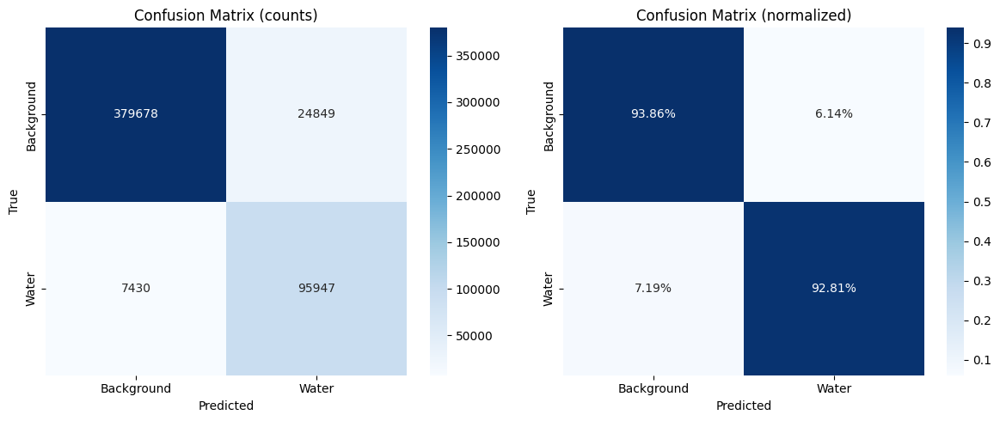

In [29]:
# Note: using threshold=0.5 here — optimal threshold found in 9.3 below
y_true_flat = all_masks.flatten().astype(int)
y_pred_flat = all_preds.flatten().astype(int)   # built with 0.5 in 9.1

print("Classification Report at threshold=0.5:")
print(classification_report(y_true_flat, y_pred_flat,
                             target_names=['Background', 'Water'], digits=4))

cm      = confusion_matrix(y_true_flat, y_pred_flat)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, data, title, fmt in zip(
        axes,
        [cm, cm_norm],
        ['Confusion Matrix (counts)', 'Confusion Matrix (normalized)'],
        ['d', '.2%']):
    sns.heatmap(data, annot=True, fmt=fmt, cmap='Blues', ax=ax,
                xticklabels=['Background', 'Water'],
                yticklabels=['Background', 'Water'])
    ax.set_xlabel('Predicted'); ax.set_ylabel('True'); ax.set_title(title)
plt.tight_layout()
plt.show()

### 9.3 Threshold Sensitivity Analysis

Best threshold (by F1): 0.75
  → F1  = 0.8680
  → IoU = 0.7668


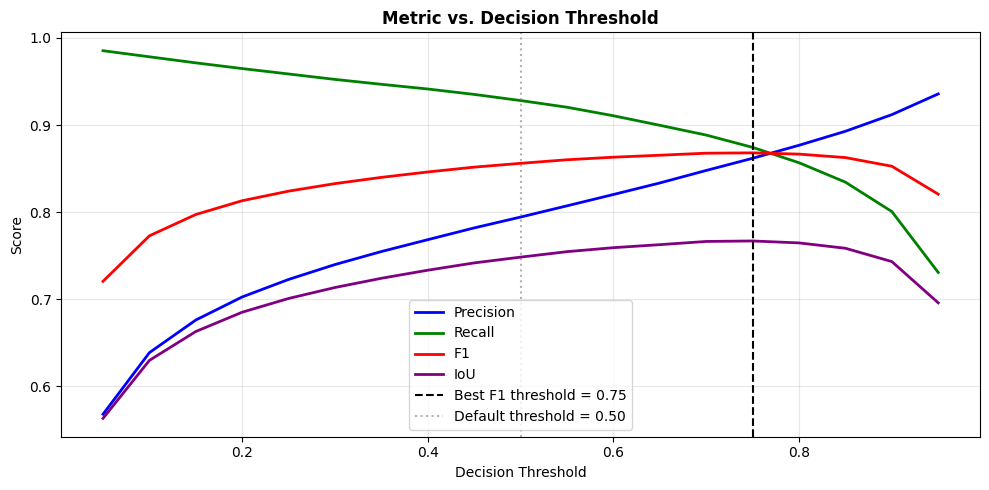


Classification Report at Best Threshold (0.75):
              precision    recall  f1-score   support

  Background     0.9678    0.9642    0.9660    404527
       Water     0.8618    0.8743    0.8680    103377

    accuracy                         0.9459    507904
   macro avg     0.9148    0.9193    0.9170    507904
weighted avg     0.9462    0.9459    0.9460    507904



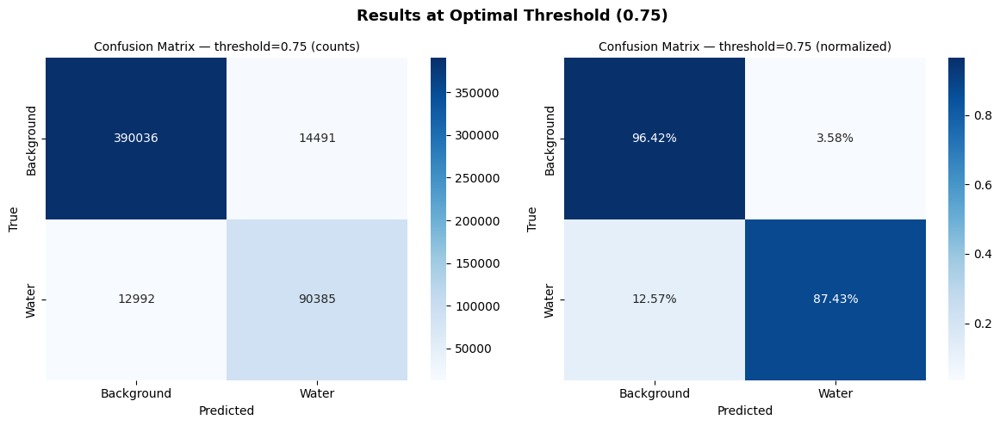

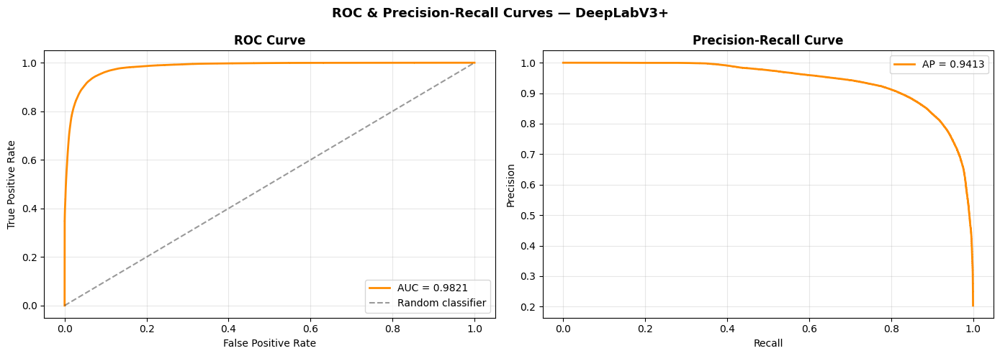

ROC-AUC Score          : 0.9821
Average Precision (AP) : 0.9413


In [30]:
thresholds    = np.arange(0.05, 0.96, 0.05)   # wider range
probs_flat    = all_probs.flatten()
thresh_results = []

for t in thresholds:
    preds_t = (probs_flat > t).astype(int)
    tp = ((preds_t==1) & (y_true_flat==1)).sum()
    fp = ((preds_t==1) & (y_true_flat==0)).sum()
    fn = ((preds_t==0) & (y_true_flat==1)).sum()
    prec = tp / (tp + fp + 1e-8)
    rec  = tp / (tp + fn + 1e-8)
    f1   = 2*prec*rec / (prec+rec+1e-8)
    iou  = tp / (tp+fp+fn+1e-8)
    thresh_results.append({'Threshold': t, 'Precision': prec,
                           'Recall': rec, 'F1': f1, 'IoU': iou})

thresh_df      = pd.DataFrame(thresh_results)
best_thresh    = thresh_df.loc[thresh_df['F1'].idxmax()]
BEST_THRESHOLD = float(best_thresh['Threshold'])

print(f"Best threshold (by F1): {BEST_THRESHOLD:.2f}")
print(f"  → F1  = {best_thresh['F1']:.4f}")
print(f"  → IoU = {best_thresh['IoU']:.4f}")

# Threshold sensitivity plot
plt.figure(figsize=(10, 5))
for col, color in zip(['Precision','Recall','F1','IoU'],
                       ['blue','green','red','purple']):
    plt.plot(thresh_df['Threshold'], thresh_df[col],
             label=col, color=color, lw=2)
plt.axvline(BEST_THRESHOLD, color='black', linestyle='--',
            label=f'Best F1 threshold = {BEST_THRESHOLD:.2f}')
plt.axvline(0.5, color='gray', linestyle=':', alpha=0.6,
            label='Default threshold = 0.50')
plt.xlabel('Decision Threshold'); plt.ylabel('Score')
plt.title('Metric vs. Decision Threshold', fontweight='bold')
plt.legend(); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

# ── Re-run classification report at BEST_THRESHOLD ──
y_pred_best = (probs_flat > BEST_THRESHOLD).astype(int)
print(f"\nClassification Report at Best Threshold ({BEST_THRESHOLD:.2f}):")
print(classification_report(y_true_flat, y_pred_best,
                             target_names=['Background', 'Water'], digits=4))

cm_best      = confusion_matrix(y_true_flat, y_pred_best)
cm_best_norm = cm_best.astype(float) / cm_best.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, data, title, fmt in zip(
        axes,
        [cm_best, cm_best_norm],
        [f'Confusion Matrix — threshold={BEST_THRESHOLD:.2f} (counts)',
         f'Confusion Matrix — threshold={BEST_THRESHOLD:.2f} (normalized)'],
        ['d', '.2%']):
    sns.heatmap(data, annot=True, fmt=fmt, cmap='Blues', ax=ax,
                xticklabels=['Background', 'Water'],
                yticklabels=['Background', 'Water'])
    ax.set_xlabel('Predicted'); ax.set_ylabel('True')
    ax.set_title(title, fontsize=10)
plt.suptitle(f'Results at Optimal Threshold ({BEST_THRESHOLD:.2f})',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# ── ROC-AUC & Precision-Recall Curves ──
from sklearn.metrics import (roc_auc_score, roc_curve,
                              average_precision_score, precision_recall_curve)

fpr, tpr, _  = roc_curve(y_true_flat, probs_flat)
auc_score    = roc_auc_score(y_true_flat, probs_flat)
avg_prec     = average_precision_score(y_true_flat, probs_flat)
prec_vals, rec_vals, _ = precision_recall_curve(y_true_flat, probs_flat)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {auc_score:.4f}')
axes[0].plot([0,1],[0,1], 'k--', alpha=0.4, label='Random classifier')
axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].set_title('ROC Curve', fontweight='bold')
axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].plot(rec_vals, prec_vals, color='darkorange', lw=2,
             label=f'AP = {avg_prec:.4f}')
axes[1].set_xlabel('Recall'); axes[1].set_ylabel('Precision')
axes[1].set_title('Precision-Recall Curve', fontweight='bold')
axes[1].legend(); axes[1].grid(True, alpha=0.3)

plt.suptitle('ROC & Precision-Recall Curves — DeepLabV3+',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

print(f"ROC-AUC Score          : {auc_score:.4f}")
print(f"Average Precision (AP) : {avg_prec:.4f}")

### 9.4 Visual Predictions

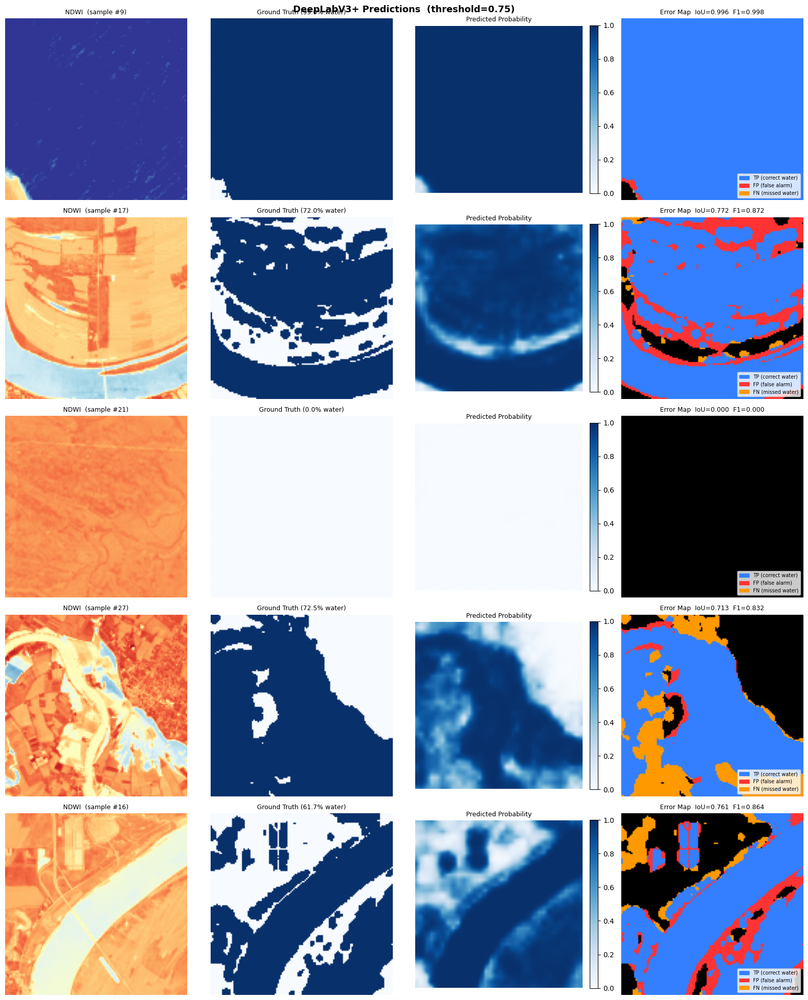

In [31]:
def plot_predictions(X_test, Y_test, all_probs, n=5, threshold=0.5):
    indices = np.random.choice(len(X_test), n, replace=False)
    fig, axes = plt.subplots(n, 4, figsize=(16, n*4))
    if n == 1:
        axes = axes[np.newaxis, :]

    for ax, title in zip(axes[0], ['NDWI Input', 'Ground Truth',
                                    'Predicted Probability', 'Error Map']):
        ax.set_title(title, fontsize=10, fontweight='bold', pad=10)

    for row, idx in enumerate(indices):
        # NDWI = index 12, MNDWI = index 13, AWEI = index 14
        ndwi_ch   = X_test[idx, :, :, 12]   # ← correct index for 15-channel array
        gt_mask   = Y_test[idx, :, :, 0]
        prob_map  = all_probs[idx, 0]        # shape (H, W) — DeepLab outputs (N,1,H,W)
        pred_mask = (prob_map > threshold).astype(float)

        inter      = (pred_mask * gt_mask).sum()
        union      = pred_mask.sum() + gt_mask.sum() - inter
        sample_iou = inter / (union + 1e-8)

        tp = ((pred_mask==1)&(gt_mask==1)).sum()
        fp = ((pred_mask==1)&(gt_mask==0)).sum()
        fn = ((pred_mask==0)&(gt_mask==1)).sum()
        sample_f1 = (2*tp) / (2*tp + fp + fn + 1e-8)

        axes[row, 0].imshow(ndwi_ch, cmap='RdYlBu', vmin=-1, vmax=1)
        axes[row, 0].set_title(f'NDWI  (sample #{idx})', fontsize=9)
        axes[row, 0].set_ylabel(f'Water: {gt_mask.mean():.1%}', fontsize=8)
        axes[row, 0].axis('off')

        axes[row, 1].imshow(gt_mask, cmap='Blues', vmin=0, vmax=1)
        axes[row, 1].set_title(f'Ground Truth ({gt_mask.mean():.1%} water)', fontsize=9)
        axes[row, 1].axis('off')

        im = axes[row, 2].imshow(prob_map, cmap='Blues', vmin=0, vmax=1)
        axes[row, 2].set_title('Predicted Probability', fontsize=9)
        axes[row, 2].axis('off')
        plt.colorbar(im, ax=axes[row, 2], fraction=0.046, pad=0.04)

        err = np.zeros((*gt_mask.shape, 3))
        err[(pred_mask==1)&(gt_mask==1)] = [0.2, 0.5, 1.0]
        err[(pred_mask==1)&(gt_mask==0)] = [1.0, 0.2, 0.2]
        err[(pred_mask==0)&(gt_mask==1)] = [1.0, 0.6, 0.0]
        axes[row, 3].imshow(err)
        tp_p = mpatches.Patch(color=[0.2,0.5,1.0], label='TP (correct water)')
        fp_p = mpatches.Patch(color=[1.0,0.2,0.2], label='FP (false alarm)')
        fn_p = mpatches.Patch(color=[1.0,0.6,0.0], label='FN (missed water)')
        axes[row, 3].legend(handles=[tp_p,fp_p,fn_p], loc='lower right', fontsize=7)
        axes[row, 3].set_title(f'Error Map  IoU={sample_iou:.3f}  F1={sample_f1:.3f}',
                               fontsize=9)
        axes[row, 3].axis('off')

    plt.suptitle(f'DeepLabV3+ Predictions  (threshold={threshold:.2f})',
                 fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()


plot_predictions(X_test, Y_test, all_probs, n=5, threshold=BEST_THRESHOLD)

### 9.5 Failure Analysis

Mean  IoU : 0.3871
Median IoU: 0.3167
Std   IoU : 0.3670
Samples with IoU < 0.3 : 15
Samples with IoU > 0.8 : 4


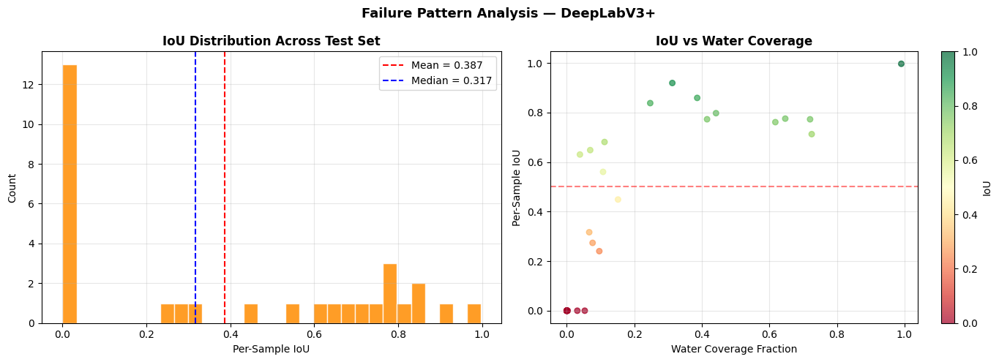


5 Worst Samples:
  sample #  0 | IoU=0.0000 | water=5.3%
  sample #  4 | IoU=0.0000 | water=0.0%
  sample # 13 | IoU=0.0000 | water=0.0%
  sample # 14 | IoU=0.0000 | water=0.0%
  sample # 21 | IoU=0.0000 | water=0.0%


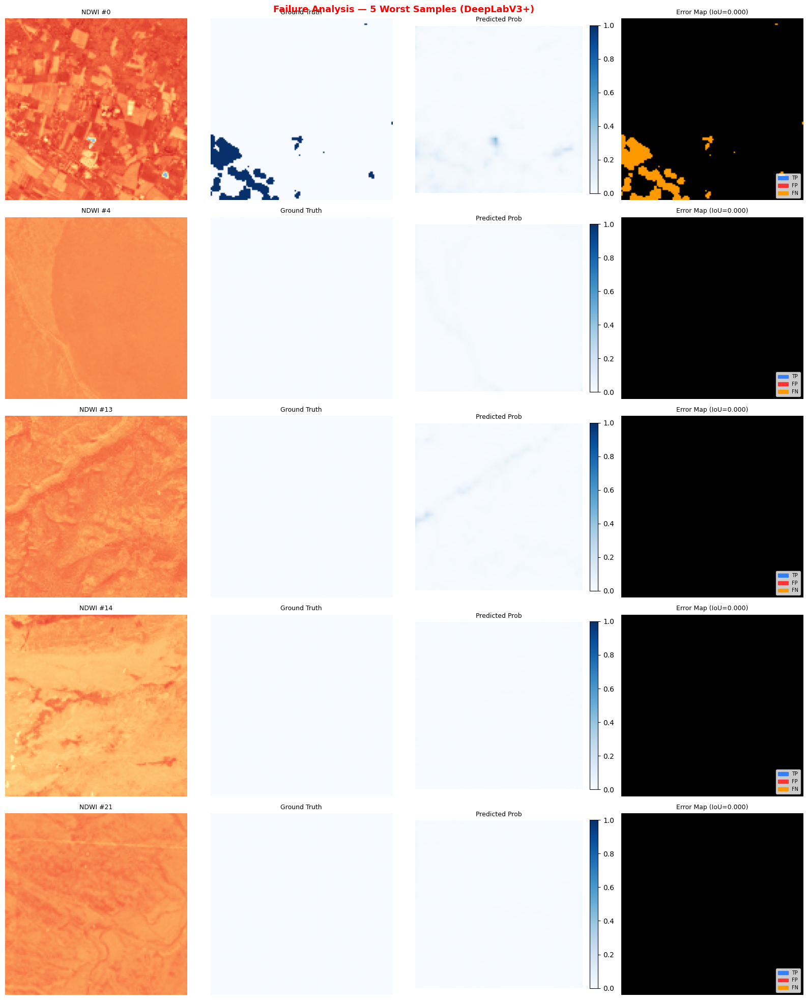


5 Best Samples:
  sample #  9 | IoU=0.9964 | water=99.0%
  sample # 29 | IoU=0.9189 | water=31.2%
  sample # 23 | IoU=0.8588 | water=38.6%
  sample # 10 | IoU=0.8377 | water=24.7%
  sample # 20 | IoU=0.7972 | water=44.2%


In [32]:
per_sample_ious = []
for i in range(len(X_test)):
    prob      = all_probs[i, 0]   # (H, W) — note index 0 not [...,0] for PyTorch shape
    pred      = (prob > BEST_THRESHOLD).astype(float)
    gt        = Y_test[i, :, :, 0]
    inter     = (pred * gt).sum()
    union     = pred.sum() + gt.sum() - inter
    per_sample_ious.append(inter / (union + 1e-8))

per_sample_ious = np.array(per_sample_ious)
water_coverage  = Y_test.squeeze().reshape(len(Y_test), -1).mean(axis=1)

print(f"Mean  IoU : {per_sample_ious.mean():.4f}")
print(f"Median IoU: {np.median(per_sample_ious):.4f}")
print(f"Std   IoU : {per_sample_ious.std():.4f}")
print(f"Samples with IoU < 0.3 : {(per_sample_ious < 0.3).sum()}")
print(f"Samples with IoU > 0.8 : {(per_sample_ious > 0.8).sum()}")

# IoU distribution + scatter
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(per_sample_ious, bins=30, color='darkorange',
             edgecolor='white', alpha=0.85)
axes[0].axvline(per_sample_ious.mean(), color='red', linestyle='--',
                label=f'Mean = {per_sample_ious.mean():.3f}')
axes[0].axvline(np.median(per_sample_ious), color='blue', linestyle='--',
                label=f'Median = {np.median(per_sample_ious):.3f}')
axes[0].set_xlabel('Per-Sample IoU'); axes[0].set_ylabel('Count')
axes[0].set_title('IoU Distribution Across Test Set', fontweight='bold')
axes[0].legend(); axes[0].grid(True, alpha=0.3)

sc = axes[1].scatter(water_coverage, per_sample_ious,
                     c=per_sample_ious, cmap='RdYlGn',
                     vmin=0, vmax=1, alpha=0.7, s=30)
plt.colorbar(sc, ax=axes[1], label='IoU')
axes[1].set_xlabel('Water Coverage Fraction')
axes[1].set_ylabel('Per-Sample IoU')
axes[1].set_title('IoU vs Water Coverage', fontweight='bold')
axes[1].axhline(0.5, color='red', linestyle='--', alpha=0.5)
axes[1].grid(True, alpha=0.3)

plt.suptitle('Failure Pattern Analysis — DeepLabV3+',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# Worst 5
worst_idx = np.argsort(per_sample_ious)[:5]
print("\n5 Worst Samples:")
for idx in worst_idx:
    print(f"  sample #{idx:3d} | IoU={per_sample_ious[idx]:.4f} "
          f"| water={water_coverage[idx]:.1%}")

fig, axes = plt.subplots(5, 4, figsize=(16, 20))
for row, idx in enumerate(worst_idx):
    ndwi_ch   = X_test[idx, :, :, 12]
    prob_map  = all_probs[idx, 0]
    pred_mask = (prob_map > BEST_THRESHOLD).astype(float)
    gt_mask   = Y_test[idx, :, :, 0]

    err = np.zeros((*gt_mask.shape, 3))
    err[(pred_mask==1)&(gt_mask==1)] = [0.2,0.5,1.0]
    err[(pred_mask==1)&(gt_mask==0)] = [1.0,0.2,0.2]
    err[(pred_mask==0)&(gt_mask==1)] = [1.0,0.6,0.0]

    axes[row,0].imshow(ndwi_ch, cmap='RdYlBu', vmin=-1, vmax=1)
    axes[row,0].set_title(f'NDWI #{idx}', fontsize=9)
    axes[row,0].set_ylabel(f'IoU={per_sample_ious[idx]:.3f}\nwater={water_coverage[idx]:.1%}', fontsize=8)
    axes[row,0].axis('off')
    axes[row,1].imshow(gt_mask, cmap='Blues'); axes[row,1].set_title('Ground Truth', fontsize=9); axes[row,1].axis('off')
    im = axes[row,2].imshow(prob_map, cmap='Blues', vmin=0, vmax=1)
    axes[row,2].set_title('Predicted Prob', fontsize=9); axes[row,2].axis('off')
    plt.colorbar(im, ax=axes[row,2], fraction=0.046, pad=0.04)
    axes[row,3].imshow(err)
    axes[row,3].legend(handles=[
        mpatches.Patch(color=[0.2,0.5,1.0], label='TP'),
        mpatches.Patch(color=[1.0,0.2,0.2], label='FP'),
        mpatches.Patch(color=[1.0,0.6,0.0], label='FN')
    ], loc='lower right', fontsize=7)
    axes[row,3].set_title(f'Error Map (IoU={per_sample_ious[idx]:.3f})', fontsize=9)
    axes[row,3].axis('off')

plt.suptitle('Failure Analysis — 5 Worst Samples (DeepLabV3+)',
             fontsize=13, fontweight='bold', color='red')
plt.tight_layout(); plt.show()

# Best 5
best_idx = np.argsort(per_sample_ious)[-5:][::-1]
print("\n5 Best Samples:")
for idx in best_idx:
    print(f"  sample #{idx:3d} | IoU={per_sample_ious[idx]:.4f} "
          f"| water={water_coverage[idx]:.1%}")